In [1]:
import copy

import pandas as pd
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.graphics.tsaplots import plot_acf

In [2]:
all_df, all_df_trade, all_df_observe, all_df_MACARONS = [], [], [], []
for day in [1,2,3]:
    df = pd.read_csv(f"./round-4-island-data-bottle/prices_round_4_day_{day}.csv", sep=";", header=0)
    df_trade = pd.read_csv(f"./round-4-island-data-bottle/trades_round_4_day_{day}.csv", sep=";", header=0)
    df_observe = pd.read_csv(f"./round-4-island-data-bottle/observations_round_4_day_{day}.csv", sep=",", header=0)
    df_MACARONS = df[df['product'] == 'MAGNIFICENT_MACARONS'].reset_index(drop=True).copy()
    all_df.append(df)
    all_df_trade.append(df_trade)
    all_df_observe.append(df_observe)
    all_df_MACARONS.append(df_MACARONS)

In [3]:
df_MACARONS

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,ask_volume_1,ask_price_2,ask_volume_2,ask_price_3,ask_volume_3,mid_price,profit_and_loss
0,3,0,MAGNIFICENT_MACARONS,667.0,14.0,665.0,14.0,658.0,25.0,676,7,685.0,25.0,692.0,14.0,671.5,0.0
1,3,100,MAGNIFICENT_MACARONS,668.0,16.0,666.0,10.0,659.0,28.0,677,8,686.0,28.0,693.0,10.0,672.5,0.0
2,3,200,MAGNIFICENT_MACARONS,665.0,14.0,662.0,14.0,656.0,20.0,674,7,683.0,20.0,689.0,14.0,669.5,0.0
3,3,300,MAGNIFICENT_MACARONS,665.0,16.0,662.0,19.0,656.0,20.0,674,8,683.0,20.0,689.0,19.0,669.5,0.0
4,3,400,MAGNIFICENT_MACARONS,664.0,18.0,662.0,19.0,655.0,30.0,673,9,682.0,30.0,689.0,19.0,668.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,3,999500,MAGNIFICENT_MACARONS,794.0,12.0,792.0,16.0,786.0,22.0,802,6,811.0,22.0,817.0,16.0,798.0,0.0
9996,3,999600,MAGNIFICENT_MACARONS,798.0,10.0,796.0,13.0,790.0,29.0,806,5,815.0,29.0,821.0,13.0,802.0,0.0
9997,3,999700,MAGNIFICENT_MACARONS,801.0,20.0,798.0,16.0,792.0,20.0,809,10,817.0,20.0,823.0,16.0,805.0,0.0
9998,3,999800,MAGNIFICENT_MACARONS,795.0,14.0,793.0,13.0,787.0,22.0,803,7,812.0,22.0,818.0,13.0,799.0,0.0


In [13]:
df_observe

,timestamp,bidPrice,askPrice,transportFees,exportTariff,importTariff,sugarPrice,sunlightIndex
0,0,627.0,628.5,1.0,9.0,-3.0,200.000000,60.00
1,100,630.0,631.5,1.0,9.0,-3.0,200.098445,60.00
2,200,630.0,631.5,1.0,9.0,-3.0,200.103915,60.00
3,300,632.0,633.5,1.0,9.0,-3.0,200.352462,60.01
4,400,630.5,632.0,1.0,9.0,-3.0,200.201545,60.01
...,...,...,...,...,...,...,...,...
9995,999500,661.0,662.5,1.4,10.5,-4.0,209.926279,64.94
9996,999600,659.5,661.0,1.4,10.5,-4.0,209.565005,64.96
9997,999700,658.5,660.0,1.4,10.5,-4.0,209.504858,64.98
9998,999800,658.0,659.5,1.4,10.5,-4.0,209.482890,65.00


In [465]:
#df.loc[:, 'ORCHIDS'] = df['ORCHIDS'].ewm(alpha = 0.05).mean().reset_index(drop=True)

In [14]:
df_observe.describe()

,timestamp,bidPrice,askPrice,transportFees,exportTariff,importTariff,sugarPrice,sunlightIndex
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,499950.000000,665.848200,667.362600,1.094830,9.993900,-3.307100,207.232481,49.751755
std,288689.567991,66.382683,66.383967,0.107877,0.608071,0.298996,7.307739,10.800482
min,0.000000,548.000000,549.500000,1.000000,9.000000,-4.000000,194.470343,20.000000
25%,249975.000000,622.500000,624.000000,1.000000,9.500000,-3.500000,199.835548,45.000000
50%,499950.000000,654.250000,656.000000,1.100000,10.500000,-3.500000,207.762831,50.265000
75%,749925.000000,689.625000,691.500000,1.100000,10.500000,-3.000000,214.179487,59.725000
max,999900.000000,852.000000,853.500000,1.400000,11.000000,-3.000000,220.140330,65.020000


In [25]:
all_df_merge = []
for i in [0, 1,2]:
    df_merge = all_df_MACARONS[i].merge(all_df_observe[i], how='left', on='timestamp')
    df_trade_macarons = all_df_trade[i][all_df_trade[i]['symbol'] == 'MAGNIFICENT_MACARONS'].reset_index(drop=True).copy()
    df_merge = df_merge.merge(df_trade_macarons, how='left', on='timestamp')
    df_merge['askPrice_syn'] = df_merge['askPrice'] + df_merge['transportFees'] - df_merge['importTariff']
    df_merge['bidPrice_syn'] = df_merge['bidPrice'] - df_merge['transportFees'] - df_merge['exportTariff']
    df_merge.drop(columns=['profit_and_loss','buyer', 'seller', 'symbol', 'currency'], inplace=True)
    all_df_merge.append(df_merge)

In [56]:
df_merge = all_df_merge[2]
df_merge[(df_merge['bidPrice_syn']>df_merge['ask_price_1']) | (df_merge['askPrice_syn']<df_merge['bid_price_1'])]

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,...,price,quantity,askPrice_syn,bidPrice_syn,ret1,sugar_ret1,forward_ret1,sunlight_ret1,csi_break,recent_break


In [26]:
all_df_merge[0]

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,...,askPrice,transportFees,exportTariff,importTariff,sugarPrice,sunlightIndex,price,quantity,askPrice_syn,bidPrice_syn
0,1,0,MAGNIFICENT_MACARONS,624.0,20.0,622.0,12.0,617.0,23.0,631,...,628.5,1.0,9.0,-3.0,200.000000,60.00,NaN,NaN,632.5,617.0
1,1,100,MAGNIFICENT_MACARONS,627.0,14.0,625.0,12.0,620.0,21.0,634,...,631.5,1.0,9.0,-3.0,200.098445,60.00,NaN,NaN,635.5,620.0
2,1,200,MAGNIFICENT_MACARONS,627.0,10.0,625.0,15.0,620.0,21.0,634,...,631.5,1.0,9.0,-3.0,200.103915,60.00,NaN,NaN,635.5,620.0
3,1,300,MAGNIFICENT_MACARONS,629.0,14.0,627.0,14.0,622.0,26.0,636,...,633.5,1.0,9.0,-3.0,200.352462,60.01,NaN,NaN,637.5,622.0
4,1,400,MAGNIFICENT_MACARONS,628.0,18.0,625.0,16.0,620.0,26.0,635,...,632.0,1.0,9.0,-3.0,200.201545,60.01,NaN,NaN,636.0,620.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10014,1,999500,MAGNIFICENT_MACARONS,657.0,20.0,655.0,17.0,649.0,24.0,666,...,662.5,1.4,10.5,-4.0,209.926279,64.94,666.0,6.0,667.9,649.1
10015,1,999600,MAGNIFICENT_MACARONS,656.0,14.0,653.0,19.0,647.0,24.0,665,...,661.0,1.4,10.5,-4.0,209.565005,64.96,NaN,NaN,666.4,647.6
10016,1,999700,MAGNIFICENT_MACARONS,655.0,18.0,652.0,15.0,646.0,29.0,664,...,660.0,1.4,10.5,-4.0,209.504858,64.98,NaN,NaN,665.4,646.6
10017,1,999800,MAGNIFICENT_MACARONS,654.0,16.0,652.0,14.0,646.0,22.0,663,...,659.5,1.4,10.5,-4.0,209.482890,65.00,NaN,NaN,664.9,646.1


In [8]:
all_df_merge[0].describe()

,day,timestamp,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,ask_volume_1,...,profit_and_loss,bidPrice,askPrice,transportFees,exportTariff,importTariff,sugarPrice,sunlightIndex,askPrice_syn,bidPrice_syn
count,10000.0,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.0,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,1.0,499950.000000,662.724700,14.723900,660.302000,14.939600,654.496200,24.717800,670.475400,7.462200,...,0.0,665.848200,667.362600,1.094830,9.993900,-3.307100,207.232481,49.751755,671.764530,654.759470
std,0.0,288689.567991,66.338375,3.692429,66.408477,3.170451,66.433547,3.636576,66.453646,1.736396,...,0.0,66.382683,66.383967,0.107877,0.608071,0.298996,7.307739,10.800482,66.494979,66.387435
min,1.0,0.000000,545.000000,2.000000,542.000000,7.000000,536.000000,10.000000,551.000000,2.000000,...,0.0,548.000000,549.500000,1.000000,9.000000,-4.000000,194.470343,20.000000,554.100000,536.400000
25%,1.0,249975.000000,619.000000,12.000000,617.000000,12.000000,611.000000,22.000000,627.000000,6.000000,...,0.0,622.500000,624.000000,1.000000,9.500000,-3.500000,199.835548,45.000000,628.100000,611.900000
50%,1.0,499950.000000,651.000000,14.000000,649.000000,15.000000,643.000000,25.000000,659.000000,7.000000,...,0.0,654.250000,656.000000,1.100000,10.500000,-3.500000,207.762831,50.265000,660.050000,643.000000
75%,1.0,749925.000000,686.000000,18.000000,684.000000,18.000000,678.000000,28.000000,695.000000,9.000000,...,0.0,689.625000,691.500000,1.100000,10.500000,-3.000000,214.179487,59.725000,696.100000,678.100000
max,1.0,999900.000000,852.000000,20.000000,849.000000,20.000000,847.000000,30.000000,857.000000,10.000000,...,0.0,852.000000,853.500000,1.400000,11.000000,-3.000000,220.140330,65.020000,858.000000,841.500000


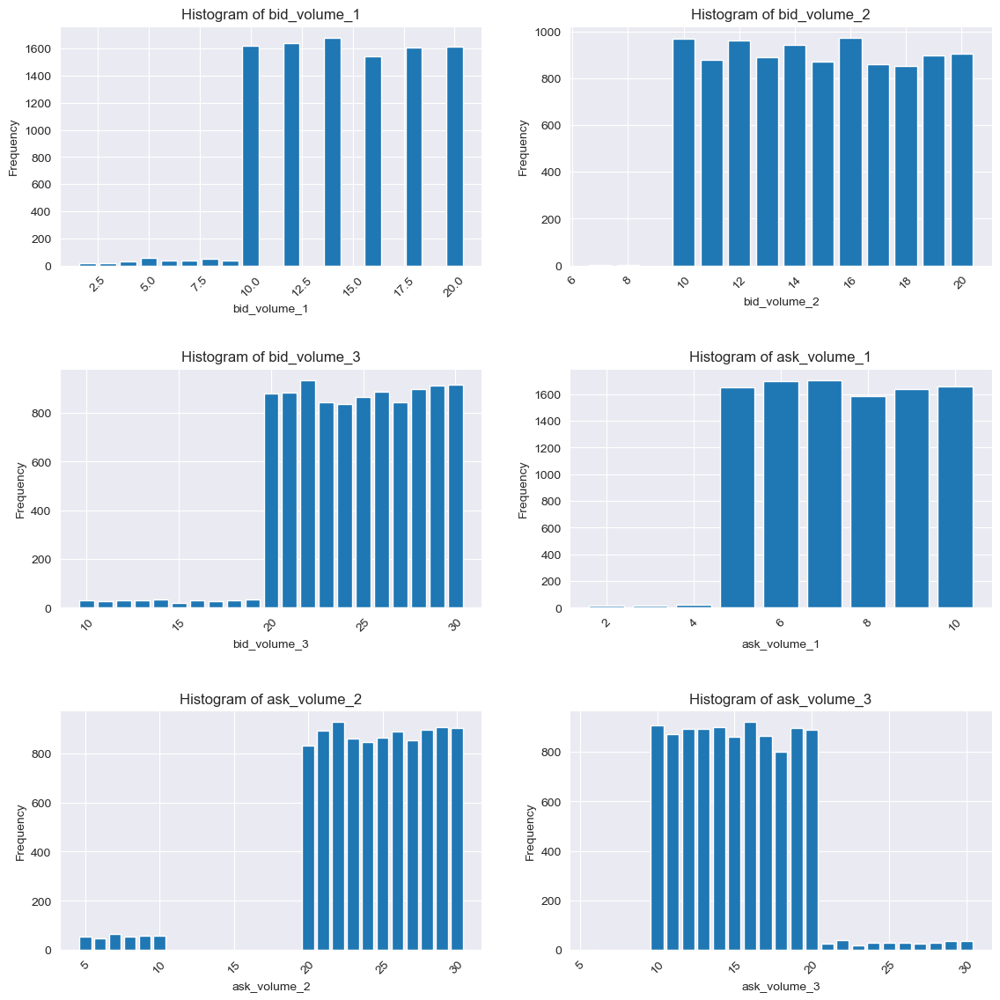

In [7]:
columns_to_plot = ['bid_volume_1', 'bid_volume_2', 'bid_volume_3',
                   'ask_volume_1', 'ask_volume_2', 'ask_volume_3']

num_plots = len(columns_to_plot)
num_rows = (num_plots + 1) // 2
num_cols = 2

plt.figure(figsize=(12, 4 * num_rows))

for i, column in enumerate(columns_to_plot, start=1):
    plt.subplot(num_rows, num_cols, i)

    volume_counts = df_merge[column].value_counts()

    plt.bar(volume_counts.index, volume_counts.values)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {column}')
    plt.xticks(rotation=45)
    plt.tight_layout(pad=3.0)

plt.show()

In [51]:
for i in range(3):
    df_merge = all_df_merge[i]
    plot = go.Figure()
    plot.add_trace(go.Scatter(
        x=df_merge['timestamp']/100,
        y=df_merge['mid_price'],
        mode='lines+markers',
        name='sunlightIndex',
        line=dict(color='blue', width=2),
        marker=dict(size=5)
    ))
    plot.show()


In [50]:
for i in range(3):
    df_merge = all_df_merge[i]
    plot = go.Figure()
    plot.add_trace(go.Scatter(
        x=df_merge['timestamp']/100,
        y=df_merge['mid_price'],
        mode='lines+markers',
        name='mid_price',
        line=dict(color='blue', width=2),
        marker=dict(size=5)
    ))
    plot.add_trace(go.Scatter(
        x=df_merge['timestamp']/100,
        y=df_merge['sugarPrice']*3,
        mode='lines+markers',
        name='sugarPrice',
        line=dict(color='red', width=2),
        marker=dict(size=5)
    ))
    plot.add_trace(go.Scatter(
        x=df_merge['timestamp']/100,
        y=df_merge['sunlightIndex']*10,
        mode='lines+markers',
        name='sunlightIndex',
        line=dict(color='green', width=2),
        marker=dict(size=5)
    ))
    # plot.add_trace(go.Scatter(
    #     x=df_merge['timestamp']/100,
    #     y=(df_merge['askPrice'] + df_merge['bidPrice'])/2,
    #     mode='lines+markers',
    #     name='mid_price',
    #     line=dict(color='yellow', width=2),
    #     marker=dict(size=5)
    # ))
    plot.show()

In [41]:
all_df_merge[i][all_df_merge[i]['timestamp']==633500]

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,...,sunlightIndex,price,quantity,askPrice_syn,bidPrice_syn,ret1,sugar_ret1,forward_ret1,sunlight_ret1,csi_break
6342,3,633500,MAGNIFICENT_MACARONS,694.0,16.0,691.0,12.0,684.0,28.0,703,...,44.99,NaN,NaN,706.6,684.4,-0.002855,0.000182,-0.002863,-0.000222,False


In [10]:
plot = go.Figure()
plot.add_trace(go.Scatter(
    x=df_merge['timestamp']/100,
    y=df_merge['sugarPrice'],
    mode='lines+markers',
    name='sugarPrice',
    line=dict(color='blue', width=2),
    marker=dict(size=5)
))

In [57]:
for i in range(3):
    df_merge = all_df_merge[i]
    df_merge['ret1'] = df_merge['mid_price'].pct_change(1)
    df_merge['forward_ret1'] = df_merge['ret1'].shift(-1)
    df_merge['sugar_ret1'] = df_merge['sugarPrice'].pct_change(1)
    df_merge['sunlight_ret1'] = df_merge['sunlightIndex'] - df_merge['sunlightIndex'].shift(-1)


In [32]:
 all_df_merge[0]

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,...,sugarPrice,sunlightIndex,price,quantity,askPrice_syn,bidPrice_syn,ret1,sugar_ret1,forward_ret1,sunlight_ret1
0,1,0,MAGNIFICENT_MACARONS,624.0,20.0,622.0,12.0,617.0,23.0,631,...,200.000000,60.00,NaN,NaN,632.5,617.0,NaN,NaN,0.004781,NaN
1,1,100,MAGNIFICENT_MACARONS,627.0,14.0,625.0,12.0,620.0,21.0,634,...,200.098445,60.00,NaN,NaN,635.5,620.0,0.004781,0.000492,0.000000,0.000000
2,1,200,MAGNIFICENT_MACARONS,627.0,10.0,625.0,15.0,620.0,21.0,634,...,200.103915,60.00,NaN,NaN,635.5,620.0,0.000000,0.000027,0.003172,0.000000
3,1,300,MAGNIFICENT_MACARONS,629.0,14.0,627.0,14.0,622.0,26.0,636,...,200.352462,60.01,NaN,NaN,637.5,622.0,0.003172,0.001242,-0.001581,0.000167
4,1,400,MAGNIFICENT_MACARONS,628.0,18.0,625.0,16.0,620.0,26.0,635,...,200.201545,60.01,NaN,NaN,636.0,620.5,-0.001581,-0.000753,0.004751,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10014,1,999500,MAGNIFICENT_MACARONS,657.0,20.0,655.0,17.0,649.0,24.0,666,...,209.926279,64.94,666.0,6.0,667.9,649.1,-0.011211,-0.001331,-0.001512,0.000308
10015,1,999600,MAGNIFICENT_MACARONS,656.0,14.0,653.0,19.0,647.0,24.0,665,...,209.565005,64.96,NaN,NaN,666.4,647.6,-0.001512,-0.001721,-0.001514,0.000308
10016,1,999700,MAGNIFICENT_MACARONS,655.0,18.0,652.0,15.0,646.0,29.0,664,...,209.504858,64.98,NaN,NaN,665.4,646.6,-0.001514,-0.000287,-0.001516,0.000308
10017,1,999800,MAGNIFICENT_MACARONS,654.0,16.0,652.0,14.0,646.0,22.0,663,...,209.482890,65.00,NaN,NaN,664.9,646.1,-0.001516,-0.000105,0.000000,0.000308


In [58]:
for csi in [40,45,50]:
    for i in range(3):
        print(csi,i)
        df_merge = all_df_merge[i]
        # df_merge['csi_break'] = (df_merge['sunlightIndex'] < csi) & (df_merge['sunlightIndex'].shift(1) >= csi)
        # df_merge['recent_break'] = df_merge['csi_break'].rolling(window=50, min_periods=1).max().shift(1).fillna(0).astype(bool)
        #df_merge_under = df_merge[(df_merge['recent_break']==1) & ()]
        df_merge_under = df_merge[(df_merge['sunlightIndex']<csi) & (df_merge['sunlight_ret1']*50 + df_merge['sunlightIndex'] < csi)]
        print(df_merge_under['sugar_ret1'].corr(df_merge_under['forward_ret1'], method='pearson'))
        #print(df_merge[df_merge['recent_break']==1])
        # df_merge = all_df_merge[i]
        # df_merge_under = df_merge[(df_merge['sunlightIndex'] < csi) & (df_merge['sunlight_ret1']<=0)]
        print(df_merge_under['forward_ret1'].describe())

40 0
-0.0007737219264895237
count    1412.000000
mean       -0.000109
std         0.003268
min        -0.011243
25%        -0.002488
50%         0.000000
75%         0.002425
max         0.010814
Name: forward_ret1, dtype: float64
40 1
nan
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: forward_ret1, dtype: float64
40 2
nan
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: forward_ret1, dtype: float64
45 0
-0.01288260099689967
count    1780.000000
mean       -0.000084
std         0.003379
min        -0.011765
25%        -0.002506
50%         0.000000
75%         0.002445
max         0.010814
Name: forward_ret1, dtype: float64
45 1
nan
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: forward_ret1, dtype: float64
45 2
0.018670882891651485
count    2620.000000
mean        0.000104
std         0.003405
min    

In [49]:
df_merge = all_df_merge[0]
df_merge[df_merge['quantity']>0]

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,...,price,quantity,askPrice_syn,bidPrice_syn,ret1,sugar_ret1,forward_ret1,sunlight_ret1,csi_break,recent_break
30,1,3000,MAGNIFICENT_MACARONS,652.0,16.0,650.0,13.0,644.0,29.0,660,...,660.0,5.0,660.5,644.5,-0.007564,-0.002475,0.000000,0.000166,False,False
173,1,17300,MAGNIFICENT_MACARONS,611.0,14.0,609.0,10.0,603.0,27.0,614,...,614.0,2.0,619.5,603.5,-0.000816,0.000120,0.000816,0.000000,False,False
198,1,19800,MAGNIFICENT_MACARONS,616.0,14.0,614.0,14.0,608.0,26.0,624,...,624.0,7.0,624.5,608.5,0.001616,0.000522,-0.012097,0.000165,False,False
209,1,20900,MAGNIFICENT_MACARONS,618.0,14.0,616.0,17.0,610.0,29.0,626,...,626.0,4.0,626.5,610.5,0.007287,0.000424,-0.004823,0.000000,False,False
225,1,22500,MAGNIFICENT_MACARONS,615.0,2.0,610.0,20.0,608.0,12.0,618,...,615.0,2.0,619.0,603.0,0.007353,0.000120,0.007299,0.000000,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9979,1,996000,MAGNIFICENT_MACARONS,671.0,18.0,669.0,20.0,663.0,21.0,680,...,680.0,4.0,681.9,663.1,0.004461,-0.000002,0.002961,0.000311,False,False
9985,1,996600,MAGNIFICENT_MACARONS,683.0,18.0,680.0,10.0,674.0,20.0,686,...,686.0,5.0,693.4,674.6,0.001463,0.002064,0.000000,0.000311,False,False
9987,1,996800,MAGNIFICENT_MACARONS,678.0,14.0,676.0,19.0,670.0,22.0,687,...,687.0,6.0,688.9,670.1,-0.002922,-0.000681,-0.002930,0.000311,False,False
9989,1,997000,MAGNIFICENT_MACARONS,669.0,12.0,667.0,12.0,661.0,29.0,678,...,678.0,5.0,679.9,661.1,-0.010287,-0.001171,0.001485,0.000310,False,False


In [ ]:
#df['HUMIDITY_DIFF'] = np.abs(df["HUMIDITY"] - 70)

In [467]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create a subplot figure with separate y-axes for each feature
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces for each feature
fig.add_trace(go.Scatter(x=df['timestamp'], y=df['ORCHIDS'], name='ORCHIDS'), secondary_y=False)
fig.add_trace(go.Scatter(x=df['timestamp'], y=df['TRANSPORT_FEES'], name='TRANSPORT_FEES'), secondary_y=True)
fig.add_trace(go.Scatter(x=df['timestamp'], y=df['EXPORT_TARIFF'], name='EXPORT_TARIFF'), secondary_y=True)
fig.add_trace(go.Scatter(x=df['timestamp'], y=df['IMPORT_TARIFF'], name='IMPORT_TARIFF'), secondary_y=True)
fig.add_trace(go.Scatter(x=df['timestamp'], y=df['SUNLIGHT'], name='SUNLIGHT'), secondary_y=True)
fig.add_trace(go.Scatter(x=df['timestamp'], y=df['HUMIDITY'], name='HUMIDITY'), secondary_y=True)
fig.add_trace(go.Scatter(x=df['timestamp'], y=df['HUMIDITY_DIFF'], name='HUMIDITY_DIFF'), secondary_y=True)

# Set the layout and axis properties
fig.update_layout(
    title='Feature Values over Time',
    xaxis_title='Timestamp',
    yaxis_title='ORCHIDS',
    legend=dict(x=0, y=1.15, orientation='h')
)

# Update y-axis titles
fig.update_yaxes(title_text="ORCHIDS", secondary_y=False)
fig.update_yaxes(title_text="Other Features", secondary_y=True)

# Show the plot
fig.show()

#127.6, 171.1

negative corr with transport fees 
mayyyyybe positive corr with export tariff?? looks shit tho 
honestly tarrifs possibly uncorr.
possibly uncorr with sunlight...if our calc is right sunlight is just nominal per day 


transportation fees perhaps lag orchids going up–could be since ducks probably set price and they know when transportation fees are going up??? but price sticky on the way down?? 




In [439]:
def get_prev_returns(df, col, its):
    prev_col = f"{col}_prev_{its}_its"
    df[prev_col] = df[col].shift(its)
    
    if col == 'HUMIDITY_DIFF':
        df[f"{col}_returns_from_{its}_its_ago"] = ((df[col] - df[prev_col]) / df[prev_col]).where(df['HUMIDITY_DIFF'] >= 10, 0)
    else:
        df[f"{col}_returns_from_{its}_its_ago"] = (df[col] - df[prev_col]) / df[prev_col]
    
    df.drop(columns=[prev_col], inplace=True)
    return df

def get_future_returns(df, col, its):
    future_col = f"{col}_future_{its}_its"
    df[future_col] = df[col].shift(-its)
    
    if col == 'HUMIDITY_DIFF':
        df[f"{col}_returns_in_{its}_its"] = ((df[future_col] - df[col]) / df[col]).where(df['HUMIDITY_DIFF'] >= 7.5, 0)
    else:
        df[f"{col}_returns_in_{its}_its"] = (df[future_col] - df[col]) / df[col]
    
    df.drop(columns=[future_col], inplace=True)
    return df

Iteration: 1
Correlation between TRANSPORT_FEES_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: 0.011262510741877937
Correlation between EXPORT_TARIFF_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: -0.023539549366130074
Correlation between IMPORT_TARIFF_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: -0.007912049628264762
Correlation between SUNLIGHT_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: -0.004308073068789502
Correlation between HUMIDITY_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: -0.004916208774808026
Correlation between HUMIDITY_DIFF_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: 0.005325146989004144


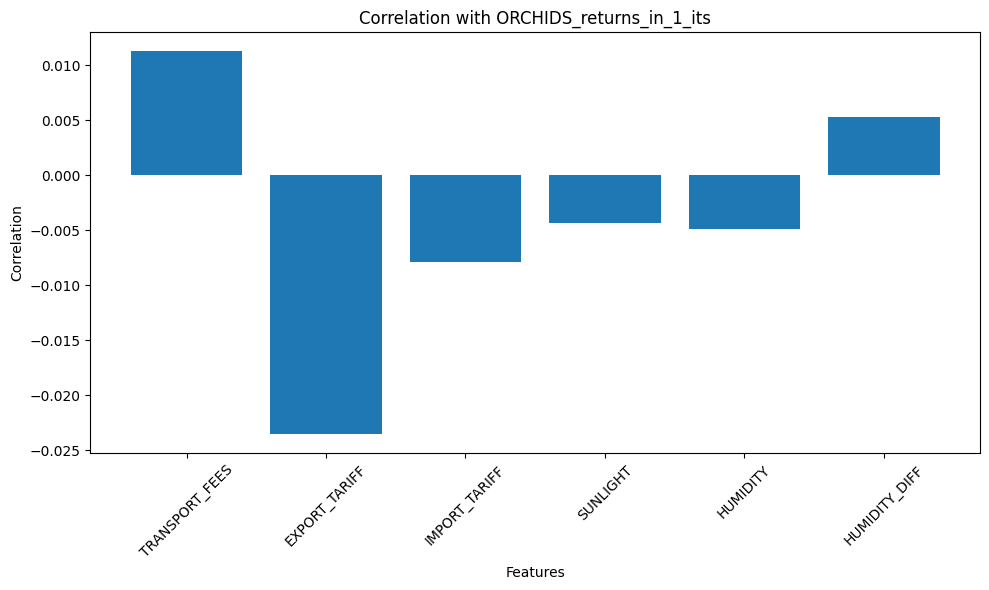

Iteration: 5
Correlation between TRANSPORT_FEES_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: -0.021358615083179527
Correlation between EXPORT_TARIFF_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: 0.0028814694781213977
Correlation between IMPORT_TARIFF_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: -0.03737567336364872
Correlation between SUNLIGHT_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: -0.010688883561248799
Correlation between HUMIDITY_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: -0.010389400609001736
Correlation between HUMIDITY_DIFF_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: 0.010542259772941223


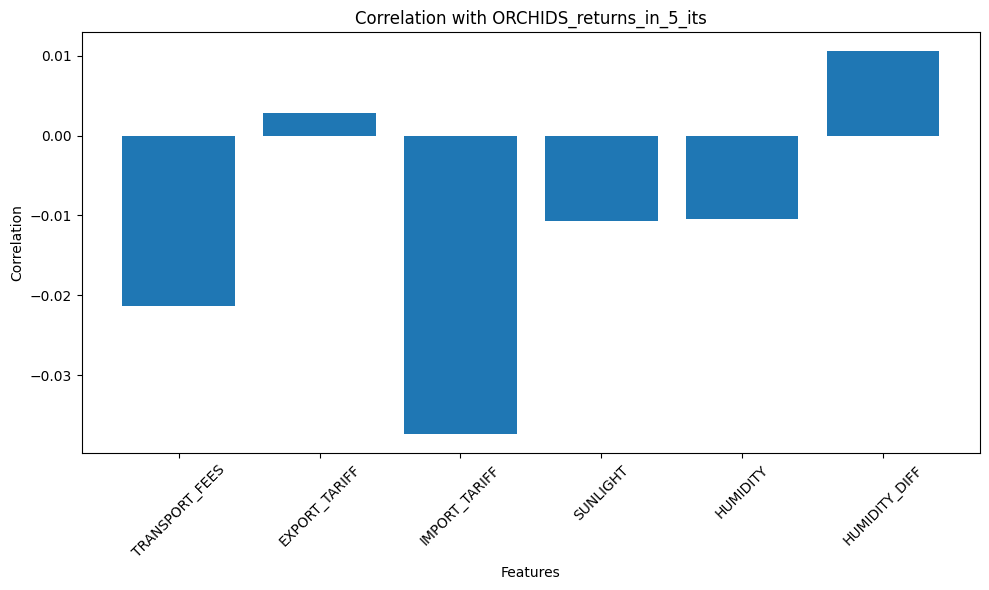

Iteration: 10
Correlation between TRANSPORT_FEES_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: -0.030193988649972674
Correlation between EXPORT_TARIFF_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: -0.021877370889119594
Correlation between IMPORT_TARIFF_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: -0.022413497387819944
Correlation between SUNLIGHT_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: -0.01708281928492128
Correlation between HUMIDITY_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: -0.013832914574449188
Correlation between HUMIDITY_DIFF_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: 0.015069485078278669


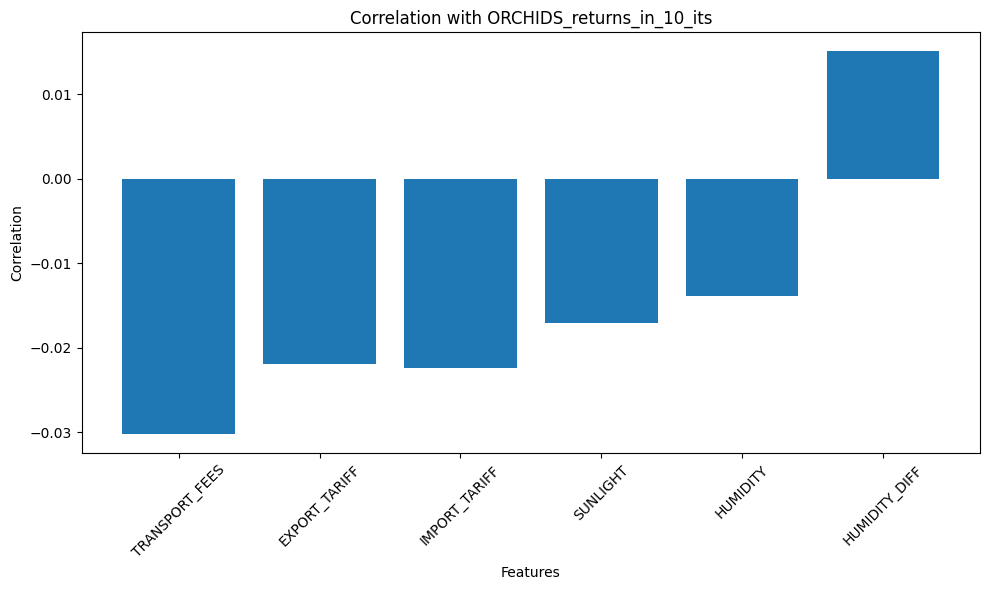

Iteration: 50
Correlation between TRANSPORT_FEES_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: 0.011437426835314459
Correlation between EXPORT_TARIFF_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: 0.07491295682776108
Correlation between IMPORT_TARIFF_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: -0.029922394536865397
Correlation between SUNLIGHT_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: -0.052736724981448574
Correlation between HUMIDITY_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: -0.022707206543812496
Correlation between HUMIDITY_DIFF_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: 0.061569449266334134


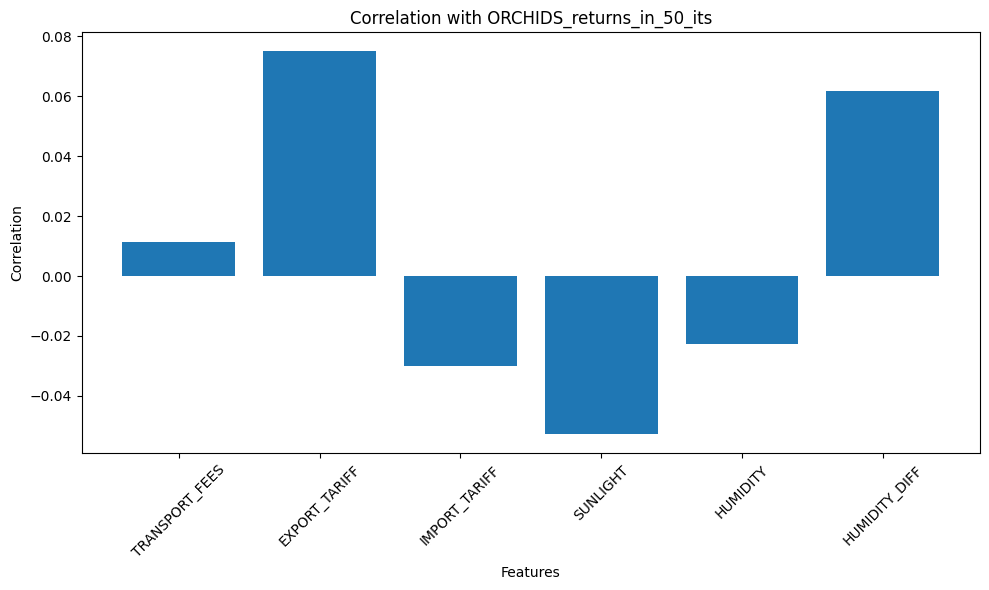

Iteration: 100
Correlation between TRANSPORT_FEES_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.0538919164696785
Correlation between EXPORT_TARIFF_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: 0.15924238844975355
Correlation between IMPORT_TARIFF_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.13135650276749844
Correlation between SUNLIGHT_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.08696893024064191
Correlation between HUMIDITY_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.02205231566478054
Correlation between HUMIDITY_DIFF_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: 0.08930565513816302


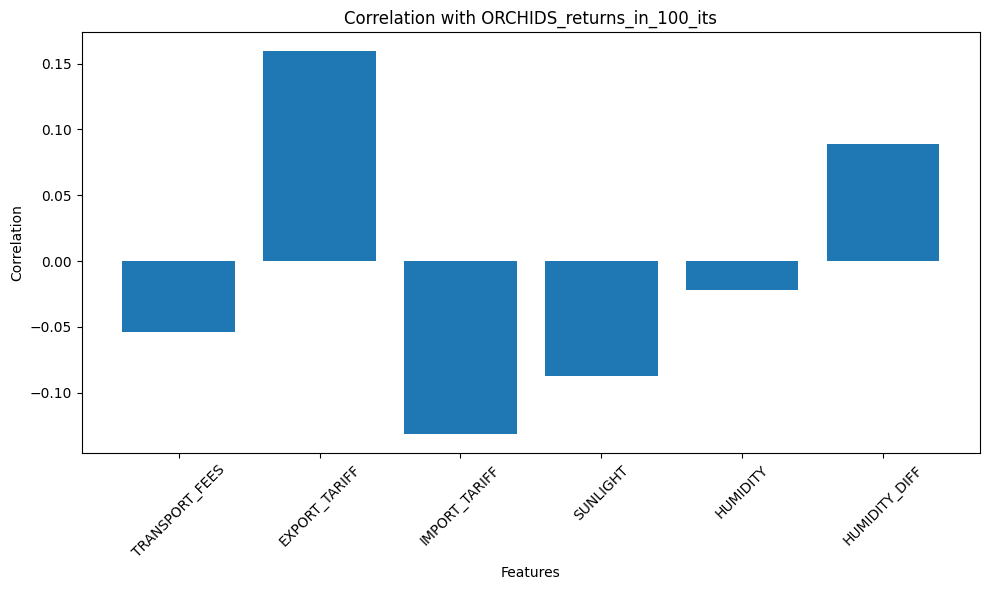

Iteration: 250
Correlation between TRANSPORT_FEES_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: -0.2784649111991953
Correlation between EXPORT_TARIFF_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: 0.16309827205608368
Correlation between IMPORT_TARIFF_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: 0.12030575973941324
Correlation between SUNLIGHT_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: -0.1350970952001932
Correlation between HUMIDITY_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: 0.006204574309757465
Correlation between HUMIDITY_DIFF_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: 0.06784906681139626


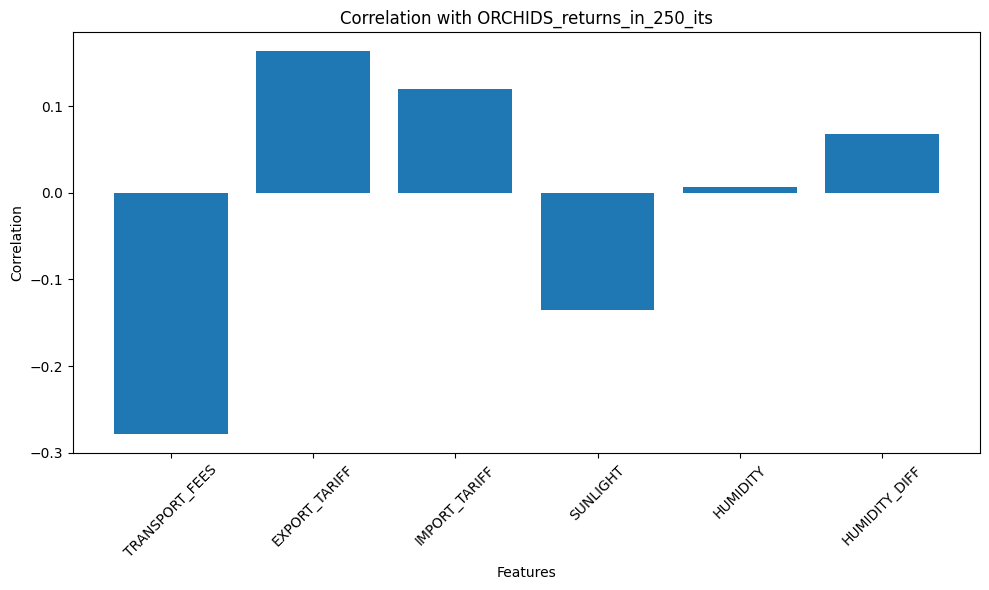

Iteration: 500
Correlation between TRANSPORT_FEES_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: 0.035739621750991234
Correlation between EXPORT_TARIFF_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: 0.3406702637502838
Correlation between IMPORT_TARIFF_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: 0.06201505781175201
Correlation between SUNLIGHT_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: -0.12510461140327592
Correlation between HUMIDITY_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: 0.12497989472401363
Correlation between HUMIDITY_DIFF_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: -0.17326958871900666


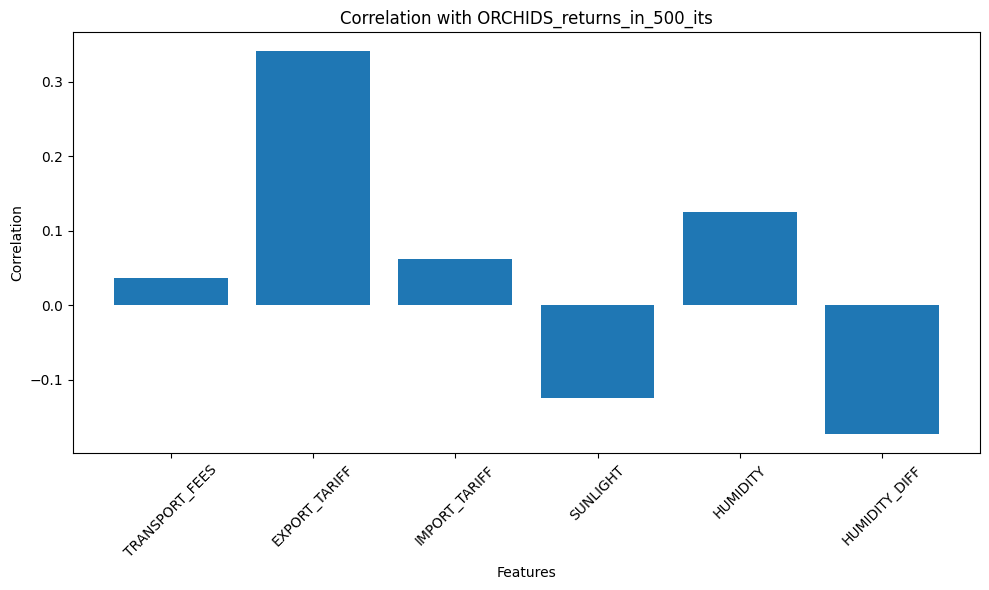

In [422]:
import pandas as pd
import matplotlib.pyplot as plt

def generate_returns_dataframe(df, iteration):
    columns_to_process = ['ORCHIDS', 'TRANSPORT_FEES', 'EXPORT_TARIFF', 'IMPORT_TARIFF', 'SUNLIGHT', 'HUMIDITY', 'HUMIDITY_DIFF']
    new_df = df.copy()

    for col in columns_to_process:
        new_df = get_prev_returns(new_df, col, iteration)
        if col == 'ORCHIDS':
            new_df = get_future_returns(new_df, col, iteration)

    return new_df

def calculate_correlation(df, iteration):
    columns_to_process = ['TRANSPORT_FEES', 'EXPORT_TARIFF', 'IMPORT_TARIFF', 'SUNLIGHT', 'HUMIDITY', 'HUMIDITY_DIFF']
    correlations = {}

    for col in columns_to_process:
        corr = df[f"{col}_returns_from_{iteration}_its_ago"].corr(df[f"ORCHIDS_returns_in_{iteration}_its"], method='pearson')
        correlations[col] = corr

    return correlations

# Assuming you have your original DataFrame named 'df'
iteration_candidates = [1, 5, 10, 50, 100, 250, 500]

for iteration in iteration_candidates:
    print(f"Iteration: {iteration}")
    new_df = generate_returns_dataframe(df, iteration)
    correlations = calculate_correlation(new_df, iteration)

    # Print the correlation values
    for col, corr in correlations.items():
        print(f"Correlation between {col}_returns_from_{iteration}_its_ago and ORCHIDS_returns_in_{iteration}_its: {corr}")

    # Create a bar graph of the correlations
    plt.figure(figsize=(10, 6))
    plt.bar(correlations.keys(), correlations.values())
    plt.xlabel('Features')
    plt.ylabel('Correlation')
    plt.title(f"Correlation with ORCHIDS_returns_in_{iteration}_its")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

Iteration: 1
Correlation between TRANSPORT_FEES_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: 0.011262510741877937
Correlation between EXPORT_TARIFF_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: -0.023539549366130074
Correlation between IMPORT_TARIFF_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: -0.007912049628264762
Correlation between SUNLIGHT_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: -0.004308073068789502
Correlation between HUMIDITY_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: -0.004916208774808026
Correlation between HUMIDITY_DIFF_returns_from_1_its_ago and ORCHIDS_returns_in_1_its: 0.005325146989004144


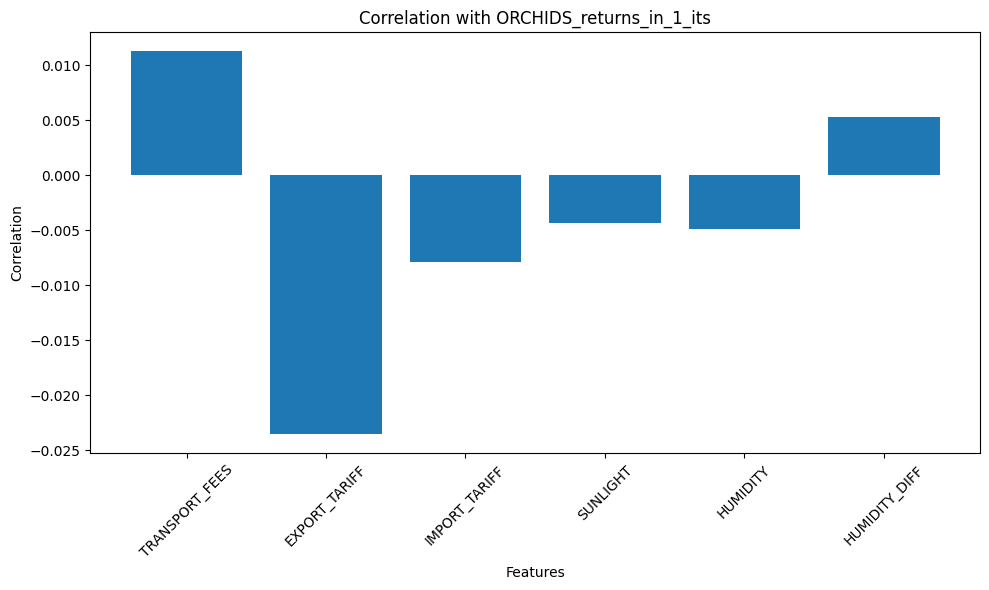

Iteration: 5
Correlation between TRANSPORT_FEES_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: -0.021358615083179527
Correlation between EXPORT_TARIFF_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: 0.0028814694781213977
Correlation between IMPORT_TARIFF_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: -0.03737567336364872
Correlation between SUNLIGHT_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: -0.010688883561248799
Correlation between HUMIDITY_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: -0.010389400609001736
Correlation between HUMIDITY_DIFF_returns_from_5_its_ago and ORCHIDS_returns_in_5_its: 0.010542259772941223


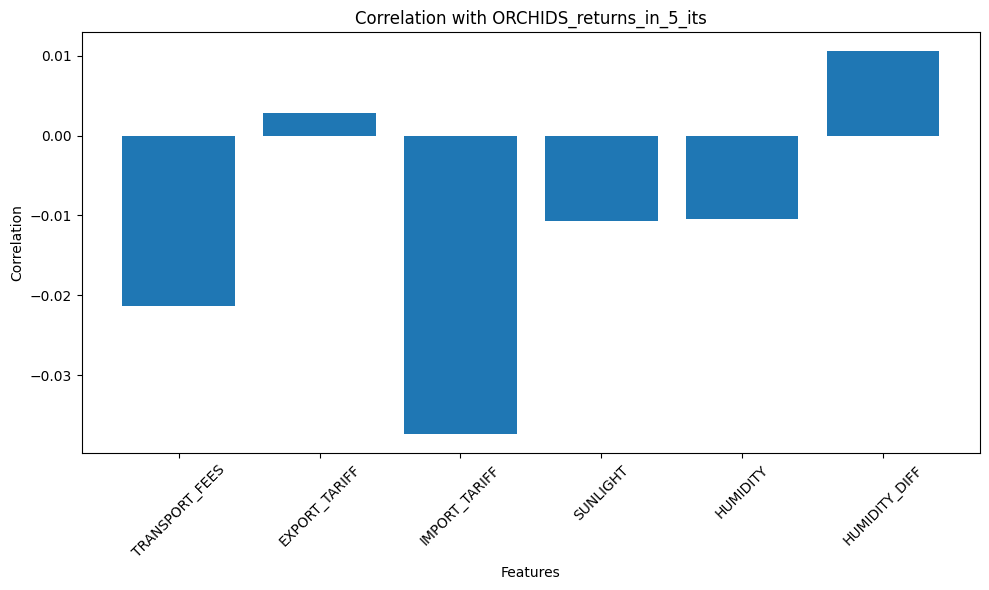

Iteration: 10
Correlation between TRANSPORT_FEES_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: -0.030193988649972674
Correlation between EXPORT_TARIFF_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: -0.021877370889119594
Correlation between IMPORT_TARIFF_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: -0.022413497387819944
Correlation between SUNLIGHT_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: -0.01708281928492128
Correlation between HUMIDITY_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: -0.013832914574449188
Correlation between HUMIDITY_DIFF_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: 0.015069485078278669


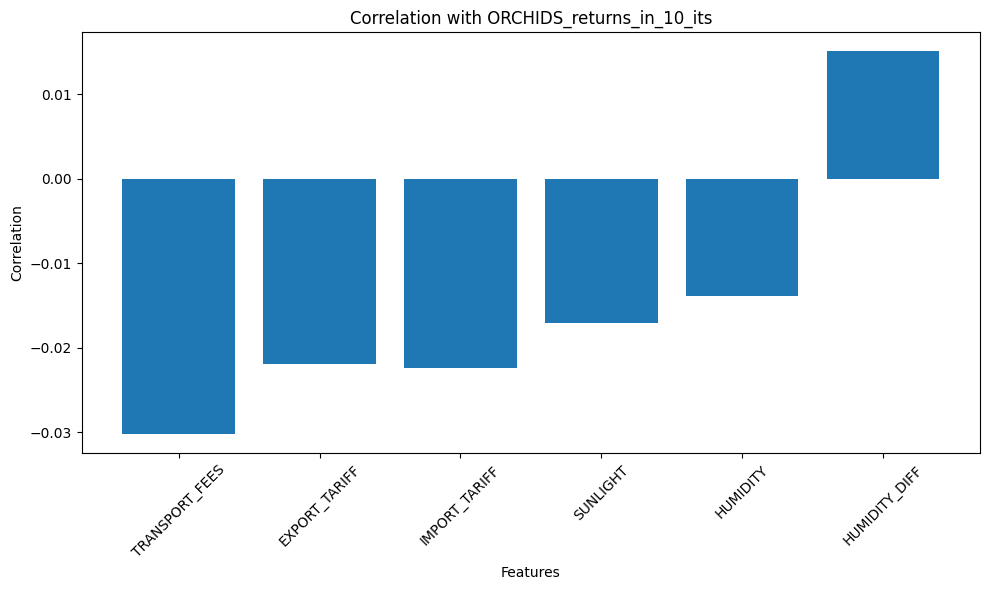

Iteration: 50
Correlation between TRANSPORT_FEES_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: 0.011437426835314459
Correlation between EXPORT_TARIFF_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: 0.07491295682776108
Correlation between IMPORT_TARIFF_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: -0.029922394536865397
Correlation between SUNLIGHT_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: -0.052736724981448574
Correlation between HUMIDITY_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: -0.022707206543812496
Correlation between HUMIDITY_DIFF_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: 0.061569449266334134


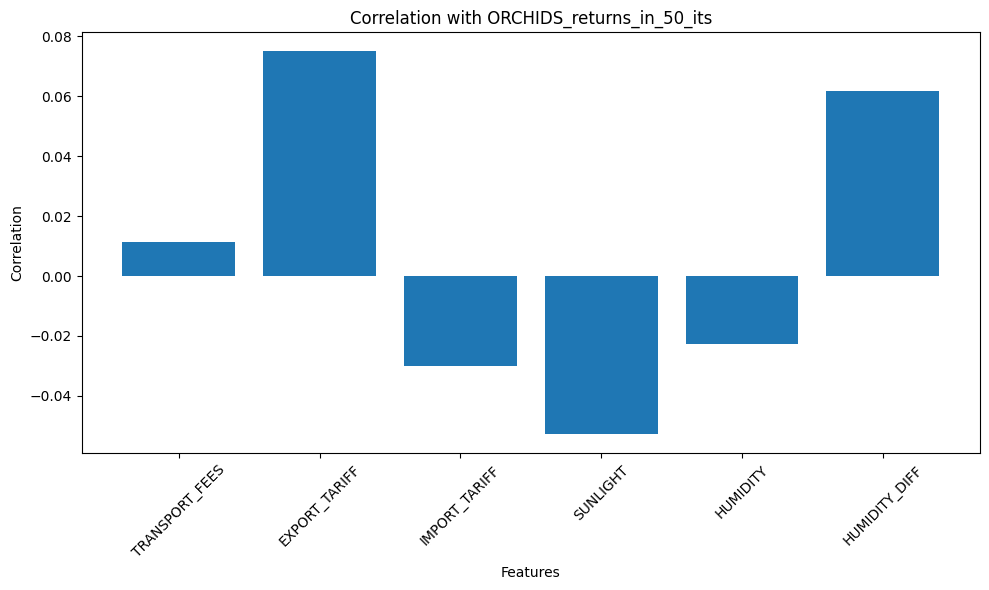

Iteration: 100
Correlation between TRANSPORT_FEES_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.0538919164696785
Correlation between EXPORT_TARIFF_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: 0.15924238844975355
Correlation between IMPORT_TARIFF_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.13135650276749844
Correlation between SUNLIGHT_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.08696893024064191
Correlation between HUMIDITY_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.02205231566478054
Correlation between HUMIDITY_DIFF_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: 0.08930565513816302


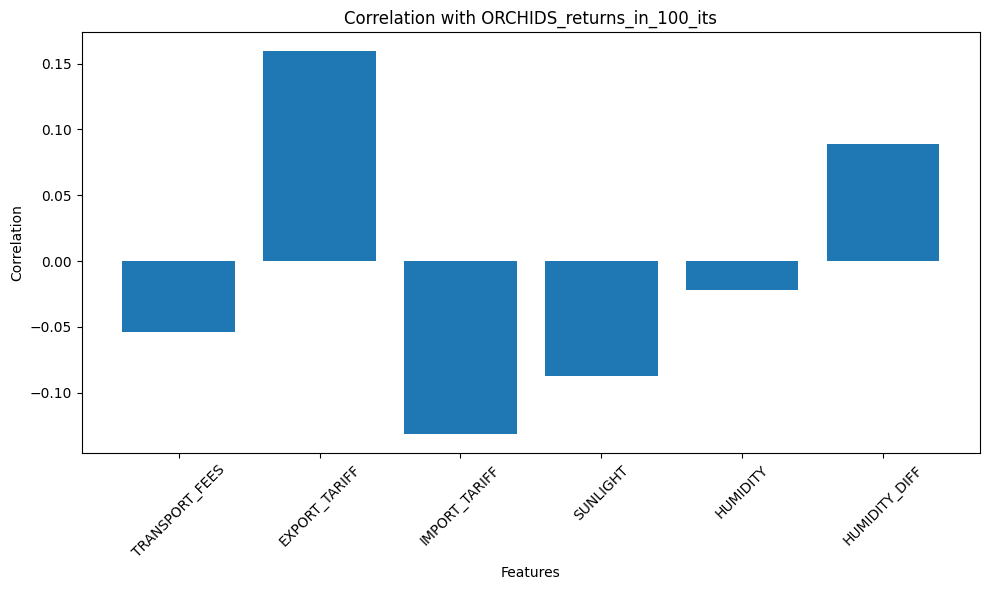

Iteration: 250
Correlation between TRANSPORT_FEES_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: -0.2784649111991953
Correlation between EXPORT_TARIFF_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: 0.16309827205608368
Correlation between IMPORT_TARIFF_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: 0.12030575973941324
Correlation between SUNLIGHT_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: -0.1350970952001932
Correlation between HUMIDITY_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: 0.006204574309757465
Correlation between HUMIDITY_DIFF_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: 0.06784906681139626


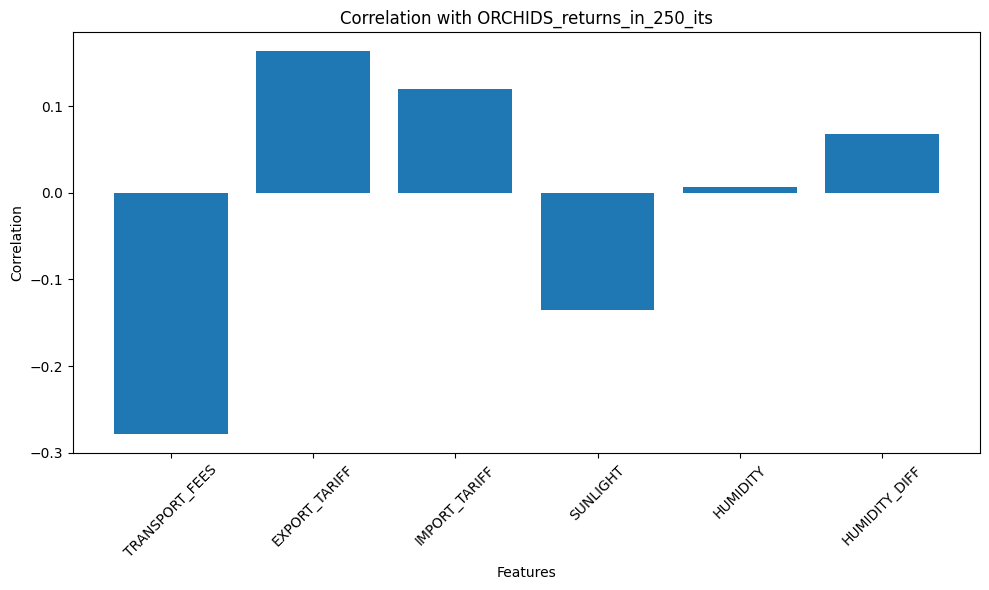

Iteration: 500
Correlation between TRANSPORT_FEES_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: 0.035739621750991234
Correlation between EXPORT_TARIFF_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: 0.3406702637502838
Correlation between IMPORT_TARIFF_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: 0.06201505781175201
Correlation between SUNLIGHT_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: -0.12510461140327592
Correlation between HUMIDITY_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: 0.12497989472401363
Correlation between HUMIDITY_DIFF_returns_from_500_its_ago and ORCHIDS_returns_in_500_its: -0.17326958871900666


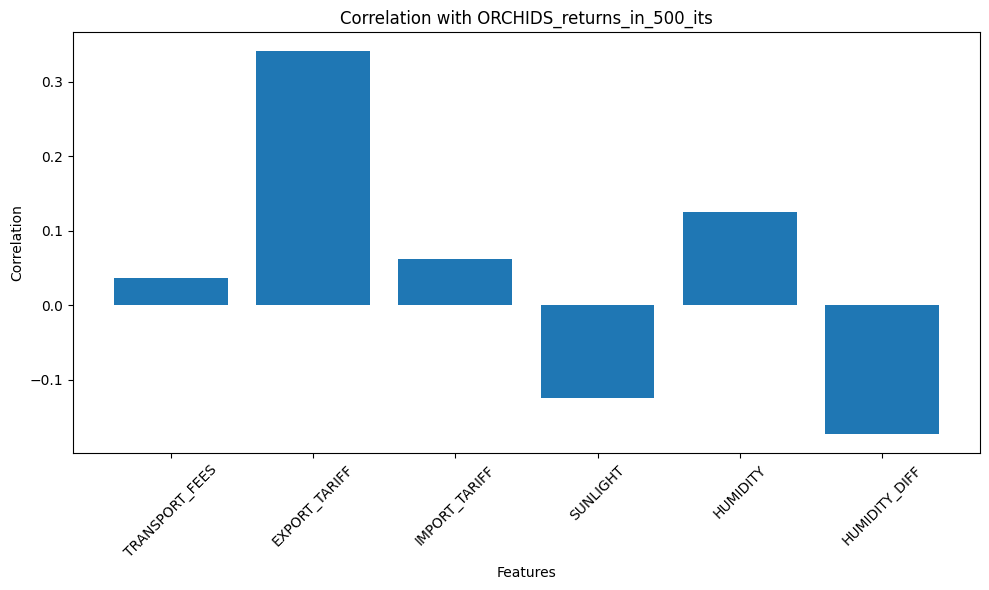

In [423]:
import pandas as pd
import matplotlib.pyplot as plt

def generate_returns_dataframe(df, iteration):
    columns_to_process = ['ORCHIDS', 'TRANSPORT_FEES', 'EXPORT_TARIFF', 'IMPORT_TARIFF', 'SUNLIGHT', 'HUMIDITY', 'HUMIDITY_DIFF']
    new_df = df.copy()

    for col in columns_to_process:
        new_df = get_prev_returns(new_df, col, iteration)
        if col == 'ORCHIDS':
            new_df = get_future_returns(new_df, col, iteration)

    return new_df

def calculate_correlation(df, iteration):
    columns_to_process = ['TRANSPORT_FEES', 'EXPORT_TARIFF', 'IMPORT_TARIFF', 'SUNLIGHT', 'HUMIDITY', 'HUMIDITY_DIFF']
    correlations = {}

    for col in columns_to_process:
        corr = df[f"{col}_returns_from_{iteration}_its_ago"].corr(df[f"ORCHIDS_returns_in_{iteration}_its"], method='pearson')
        correlations[col] = corr

    return correlations

# Assuming you have your original DataFrame named 'df'
iteration_candidates = [1, 5, 10, 50, 100, 250, 500]

for iteration in iteration_candidates:
    print(f"Iteration: {iteration}")
    new_df = generate_returns_dataframe(df, iteration)
    correlations = calculate_correlation(new_df, iteration)

    # Print the correlation values
    for col, corr in correlations.items():
        print(f"Correlation between {col}_returns_from_{iteration}_its_ago and ORCHIDS_returns_in_{iteration}_its: {corr}")

    # Create a bar graph of the correlations
    plt.figure(figsize=(10, 6))
    plt.bar(correlations.keys(), correlations.values())
    plt.xlabel('Features')
    plt.ylabel('Correlation')
    plt.title(f"Correlation with ORCHIDS_returns_in_{iteration}_its")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

Iteration: 100
Correlation between ORCHIDS_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.037780744518874296
Correlation between TRANSPORT_FEES_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.0538919164696785
Correlation between EXPORT_TARIFF_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: 0.15924238844975355
Correlation between IMPORT_TARIFF_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.13135650276749844
Correlation between SUNLIGHT_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.08696893024064191
Correlation between HUMIDITY_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: -0.02205231566478054
Correlation between HUMIDITY_DIFF_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: 0.08930565513816302
Iteration: 150
Correlation between ORCHIDS_returns_from_150_its_ago and ORCHIDS_returns_in_150_its: 0.031753404348641476
Correlation between TRANSPORT_FEES_returns_from_150_its_ago and ORCHIDS_returns_in_150_its: -0.17

/Users/liuer/opt/anaconda3/envs/unborked/lib/python3.11/site-packages/numpy/lib/function_base.py:2742: RuntimeWarning:

invalid value encountered in subtract



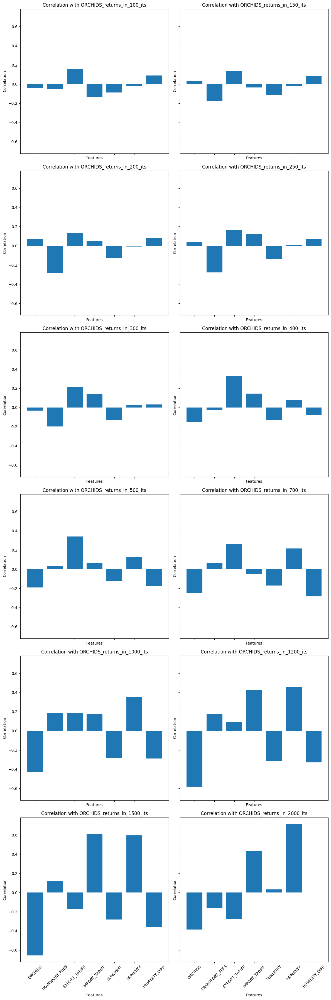

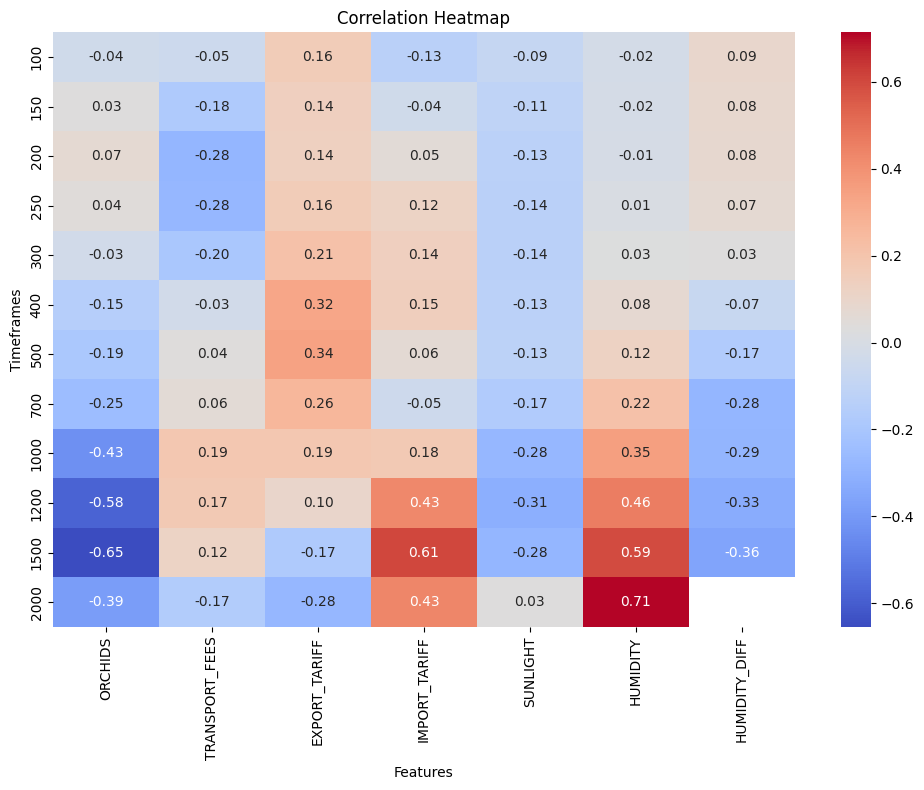

In [424]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def generate_returns_dataframe(df, iteration):
    columns_to_process = ['ORCHIDS', 'TRANSPORT_FEES', 'EXPORT_TARIFF', 'IMPORT_TARIFF', 'SUNLIGHT', 'HUMIDITY', 'HUMIDITY_DIFF']
    new_df = df.copy()

    for col in columns_to_process:
        new_df = get_prev_returns(new_df, col, iteration)
        new_df = get_future_returns(new_df, col, iteration)

    return new_df

def calculate_correlation(df, iteration):
    columns_to_process = ['ORCHIDS', 'TRANSPORT_FEES', 'EXPORT_TARIFF', 'IMPORT_TARIFF', 'SUNLIGHT', 'HUMIDITY', 'HUMIDITY_DIFF']
    correlations = {}

    for col in columns_to_process:
        corr = df[f"{col}_returns_from_{iteration}_its_ago"].corr(df[f"ORCHIDS_returns_in_{iteration}_its"], method='pearson')
        correlations[col] = corr

    return correlations

# Assuming you have your original DataFrame named 'df'
iteration_candidates = [100, 150, 200, 250, 300, 400, 500, 700, 1000, 1200, 1500, 2000]
correlation_data = {}

for iteration in iteration_candidates:
    print(f"Iteration: {iteration}")
    new_df = generate_returns_dataframe(df, iteration)
    correlations = calculate_correlation(new_df, iteration)
    correlation_data[iteration] = correlations

    # Print the correlation values
    for col, corr in correlations.items():
        print(f"Correlation between {col}_returns_from_{iteration}_its_ago and ORCHIDS_returns_in_{iteration}_its: {corr}")

# Create a grid of bar charts
num_iterations = len(iteration_candidates)
num_cols = 2
num_rows = (num_iterations + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 6 * num_rows), sharex=True, sharey=True)
axes = axes.flatten()

for i, iteration in enumerate(iteration_candidates):
    ax = axes[i]
    correlations = correlation_data[iteration]
    ax.bar(correlations.keys(), correlations.values())
    ax.set_xlabel('Features')
    ax.set_ylabel('Correlation')
    ax.set_title(f"Correlation with ORCHIDS_returns_in_{iteration}_its")
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# Create a heatmap
heatmap_data = pd.DataFrame(correlation_data).T
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt='.2f')
plt.xlabel('Features')
plt.ylabel('Timeframes')
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

Iteration: 100
Correlation between ORCHIDS_returns_from_100_its_ago and ORCHIDS_returns_in_500_its: -0.06589416041400281
Correlation between TRANSPORT_FEES_returns_from_100_its_ago and ORCHIDS_returns_in_500_its: -0.09126233362490499
Correlation between EXPORT_TARIFF_returns_from_100_its_ago and ORCHIDS_returns_in_500_its: 0.1629060280951892
Correlation between IMPORT_TARIFF_returns_from_100_its_ago and ORCHIDS_returns_in_500_its: 0.048974758396420646
Correlation between SUNLIGHT_returns_from_100_its_ago and ORCHIDS_returns_in_500_its: -0.15888275441210506
Correlation between HUMIDITY_returns_from_100_its_ago and ORCHIDS_returns_in_500_its: 0.0360770463020351
Correlation between HUMIDITY_DIFF_returns_from_100_its_ago and ORCHIDS_returns_in_500_its: -0.06656971549041443
Iteration: 150
Correlation between ORCHIDS_returns_from_150_its_ago and ORCHIDS_returns_in_500_its: -0.07809624095166551
Correlation between TRANSPORT_FEES_returns_from_150_its_ago and ORCHIDS_returns_in_500_its: -0.0942

/Users/liuer/opt/anaconda3/envs/unborked/lib/python3.11/site-packages/numpy/lib/function_base.py:2742: RuntimeWarning:

invalid value encountered in subtract



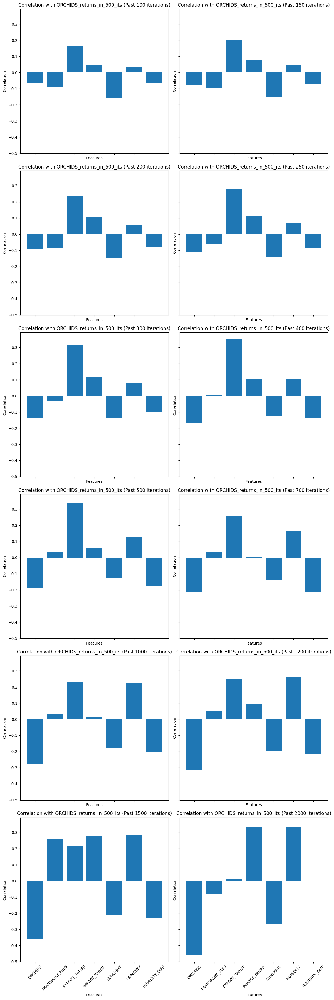

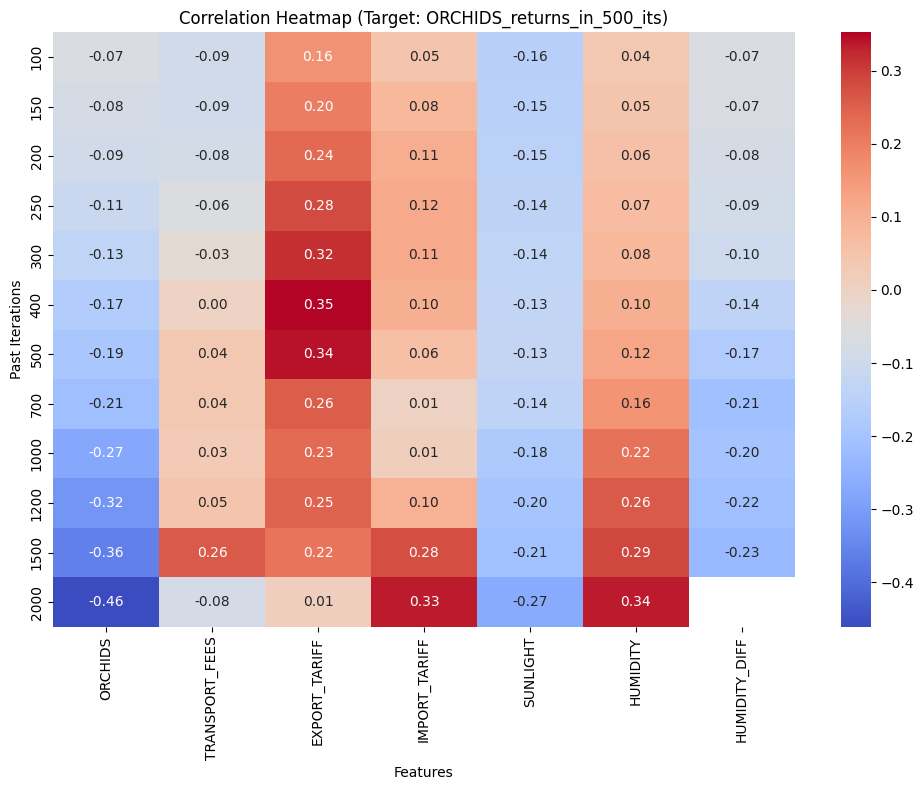

In [425]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def generate_returns_dataframe(df, iteration):
    columns_to_process = ['ORCHIDS', 'TRANSPORT_FEES', 'EXPORT_TARIFF', 'IMPORT_TARIFF', 'SUNLIGHT', 'HUMIDITY', 'HUMIDITY_DIFF']
    new_df = df.copy()

    for col in columns_to_process:
        new_df = get_prev_returns(new_df, col, iteration)
        if col == 'ORCHIDS':
            new_df = get_future_returns(new_df, col, 500)  # Standardize to 500 iterations for ORCHIDS' future returns

    return new_df

def calculate_correlation(df, iteration):
    columns_to_process = ['ORCHIDS', 'TRANSPORT_FEES', 'EXPORT_TARIFF', 'IMPORT_TARIFF', 'SUNLIGHT', 'HUMIDITY', 'HUMIDITY_DIFF']
    correlations = {}

    for col in columns_to_process:
        corr = df[f"{col}_returns_from_{iteration}_its_ago"].corr(df["ORCHIDS_returns_in_500_its"], method='pearson')
        correlations[col] = corr

    return correlations

# Assuming you have your original DataFrame named 'df'
iteration_candidates = [100, 150, 200, 250, 300, 400, 500, 700, 1000, 1200, 1500, 2000]
correlation_data = {}

for iteration in iteration_candidates:
    print(f"Iteration: {iteration}")
    new_df = generate_returns_dataframe(df, iteration)
    correlations = calculate_correlation(new_df, iteration)
    correlation_data[iteration] = correlations

    # Print the correlation values
    for col, corr in correlations.items():
        print(f"Correlation between {col}_returns_from_{iteration}_its_ago and ORCHIDS_returns_in_500_its: {corr}")

# Create a grid of bar charts
num_iterations = len(iteration_candidates)
num_cols = 2
num_rows = (num_iterations + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 6 * num_rows), sharex=True, sharey=True)
axes = axes.flatten()

for i, iteration in enumerate(iteration_candidates):
    ax = axes[i]
    correlations = correlation_data[iteration]
    ax.bar(correlations.keys(), correlations.values())
    ax.set_xlabel('Features')
    ax.set_ylabel('Correlation')
    ax.set_title(f"Correlation with ORCHIDS_returns_in_500_its (Past {iteration} iterations)")
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# Create a heatmap
heatmap_data = pd.DataFrame(correlation_data).T
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt='.2f')
plt.xlabel('Features')
plt.ylabel('Past Iterations')
plt.title("Correlation Heatmap (Target: ORCHIDS_returns_in_500_its)")
plt.tight_layout()
plt.show()

linear regression: 

target: orchids returns in 500 its

features:
- orchids_returns in last 700 its
- export tariff last 500 its 
- humidity_diff last 700 its 
- 

In [426]:
df_humidity_over_10 = df[df['HUMIDITY_DIFF'] >= 10]

In [427]:
df_humidity_over_10

,timestamp,ORCHIDS,TRANSPORT_FEES,EXPORT_TARIFF,IMPORT_TARIFF,SUNLIGHT,HUMIDITY,HUMIDITY_DIFF,ORCHIDS_returns_from_100_its_ago
0,0,1111.75,1.5,10.5,-2.0,4500.0000,95.000000,25.000000,NaN
1,100,1111.75,1.5,10.5,-2.0,4500.0356,94.995990,24.995990,NaN
2,200,1109.75,1.5,10.5,-2.0,4500.0700,94.991980,24.991980,NaN
3,300,1109.25,1.5,10.5,-2.0,4500.1016,94.987970,24.987970,NaN
4,400,1110.75,1.5,10.5,-2.0,4500.1313,94.983950,24.983950,NaN
...,...,...,...,...,...,...,...,...,...
6496,649600,1015.75,1.6,9.5,-2.4,2249.9507,59.999588,10.000412,0.006939
6497,649700,1016.25,1.6,9.5,-2.4,2249.9688,59.999580,10.000420,0.007435
6498,649800,1017.25,1.6,9.5,-2.4,2249.9830,59.999650,10.000350,0.007428
6499,649900,1016.25,1.6,9.5,-2.4,2249.9934,59.999786,10.000214,0.006936


Iteration: 10
Correlation between HUMIDITY_DIFF_returns_from_10_its_ago and ORCHIDS_returns_in_10_its: 0.03515132342175575
Iteration: 50
Correlation between HUMIDITY_DIFF_returns_from_50_its_ago and ORCHIDS_returns_in_50_its: 0.15229698252254154
Iteration: 75
Correlation between HUMIDITY_DIFF_returns_from_75_its_ago and ORCHIDS_returns_in_75_its: 0.20992385542943212
Iteration: 87
Correlation between HUMIDITY_DIFF_returns_from_87_its_ago and ORCHIDS_returns_in_87_its: 0.22924694259922446
Iteration: 100
Correlation between HUMIDITY_DIFF_returns_from_100_its_ago and ORCHIDS_returns_in_100_its: 0.23415144742575636
Iteration: 150
Correlation between HUMIDITY_DIFF_returns_from_150_its_ago and ORCHIDS_returns_in_150_its: 0.21366795369197722
Iteration: 200
Correlation between HUMIDITY_DIFF_returns_from_200_its_ago and ORCHIDS_returns_in_200_its: 0.1969605942654459
Iteration: 250
Correlation between HUMIDITY_DIFF_returns_from_250_its_ago and ORCHIDS_returns_in_250_its: 0.16659562195987412
Itera

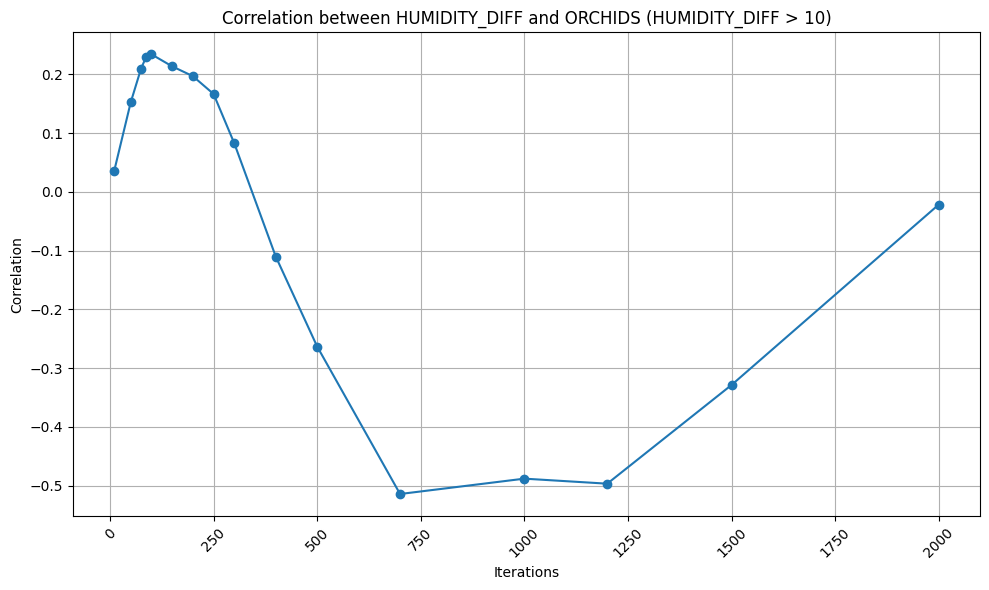

In [428]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def generate_returns_dataframe(df, iteration):
    columns_to_process = ['ORCHIDS', 'HUMIDITY_DIFF']
    new_df = df.copy()

    for col in columns_to_process:
        new_df = get_prev_returns(new_df, col, iteration)
        new_df = get_future_returns(new_df, col, iteration)  # Use the same iteration for both HUMIDITY_DIFF and ORCHIDS

    return new_df

def calculate_correlation(df, iteration):
    columns_to_process = ['HUMIDITY_DIFF']
    correlations = {}

    for col in columns_to_process:
        corr = df[f"{col}_returns_from_{iteration}_its_ago"].corr(df[f"ORCHIDS_returns_in_{iteration}_its"], method='pearson')
        correlations[col] = corr

    return correlations

# Assuming you have your original DataFrame named 'df'
iteration_candidates = [10, 50, 75, 87, 100, 150, 200, 250, 300, 400, 500, 700, 1000, 1200, 1500, 2000]
correlation_data = {}

for iteration in iteration_candidates:
    print(f"Iteration: {iteration}")
    new_df = generate_returns_dataframe(df, iteration)
    new_df = new_df[new_df['HUMIDITY_DIFF'] > 10]  # Restrict to only when HUMIDITY_DIFF > 10
    correlations = calculate_correlation(new_df, iteration)
    correlation_data[iteration] = correlations

    # Print the correlation values
    for col, corr in correlations.items():
        print(f"Correlation between {col}_returns_from_{iteration}_its_ago and ORCHIDS_returns_in_{iteration}_its: {corr}")

# Create a line plot of the correlations
plt.figure(figsize=(10, 6))
plt.plot(iteration_candidates, [correlation_data[i]['HUMIDITY_DIFF'] for i in iteration_candidates], marker='o')
plt.xlabel('Iterations')
plt.ylabel('Correlation')
plt.title("Correlation between HUMIDITY_DIFF and ORCHIDS (HUMIDITY_DIFF > 10)")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [429]:
import pandas as pd
from sklearn.linear_model import LinearRegression

def generate_returns_dataframe(df, iteration):
    columns_to_process = ['ORCHIDS', 'HUMIDITY_DIFF']
    new_df = df.copy()

    for col in columns_to_process:
        new_df = get_prev_returns(new_df, col, iteration)
        new_df = get_future_returns(new_df, col, iteration)

    return new_df

# Assuming you have your original DataFrame named 'df'
iteration = 100

# Generate the returns DataFrame
new_df = generate_returns_dataframe(df, iteration).dropna()

# Restrict the DataFrame to HUMIDITY_DIFF >= 10
new_df = new_df[new_df['HUMIDITY_DIFF'] >= 10]

# Prepare the input features (X) and target variable (y) for linear regression
X = new_df[f"HUMIDITY_DIFF_returns_from_{iteration}_its_ago"].values.reshape(-1, 1)
y = new_df[f"ORCHIDS_returns_in_{iteration}_its"].values.reshape(-1, 1)

# Create a linear regression model with no constant term
model = LinearRegression(fit_intercept=False)

# Fit the model
model.fit(X, y)

# Print the coefficient (slope) of the linear regression
coefficient = model.coef_[0][0]
print(f"Coefficient (Slope) of Linear Regression: {coefficient}")

Coefficient (Slope) of Linear Regression: 0.054364026489333764


In [404]:
new_df

,timestamp,ORCHIDS,TRANSPORT_FEES,EXPORT_TARIFF,IMPORT_TARIFF,SUNLIGHT,HUMIDITY,HUMIDITY_DIFF,ORCHIDS_returns_from_100_its_ago,ORCHIDS_returns_in_100_its,HUMIDITY_DIFF_returns_from_100_its_ago,HUMIDITY_DIFF_returns_in_100_its
100,10000,1114.873322,1.5,10.5,-2.0,4493.8555,94.591385,24.591385,0.002809,-0.000162,-0.016345,-0.016925
101,10100,1114.917391,1.5,10.5,-2.0,4493.6978,94.587240,24.587240,0.002849,-0.000154,-0.016353,-0.016928
102,10200,1114.959234,1.5,10.5,-2.0,4493.5376,94.583100,24.583100,0.003520,-0.000169,-0.016360,-0.016932
103,10300,1115.049206,1.5,10.5,-2.0,4493.3760,94.578950,24.578950,0.004039,-0.000183,-0.016369,-0.016935
104,10400,1115.122080,1.5,10.5,-2.0,4493.2124,94.574810,24.574810,0.004067,-0.000163,-0.016376,-0.016938
...,...,...,...,...,...,...,...,...,...,...,...,...
6496,649600,1012.020488,1.6,9.5,-2.4,2249.9507,59.999588,10.000412,-0.002585,0.007692,0.034723,-0.033270
6497,649700,1012.231964,1.6,9.5,-2.4,2249.9688,59.999580,10.000420,-0.002087,0.007281,0.034048,-0.033909
6498,649800,1012.482866,1.6,9.5,-2.4,2249.9830,59.999650,10.000350,-0.001613,0.006767,0.033371,-0.034546
6499,649900,1012.671222,1.6,9.5,-2.4,2249.9934,59.999786,10.000214,-0.001187,0.006353,0.032695,-0.035182


In [430]:

df_day_0 = pd.read_csv(f"./round-2-island-data-bottle/prices_round_2_day_{0}.csv", sep=";", header=0)
df_day_1 = pd.read_csv(f"./round-2-island-data-bottle/prices_round_2_day_{1}.csv", sep=";", header=0)

In [431]:
df_day_0 = df_day_0[['timestamp', 'ORCHIDS', 'TRANSPORT_FEES', 'EXPORT_TARIFF', 'IMPORT_TARIFF','SUNLIGHT', 'HUMIDITY']]
df_day_0.loc[:, 'ORCHIDS'] = df_day_0['ORCHIDS'].ewm(alpha = 0.05).mean().reset_index(drop=True)
df_day_0['HUMIDITY_DIFF'] = np.abs(df_day_0["HUMIDITY"] - 70)

In [432]:
df_day_1 = df_day_1[['timestamp', 'ORCHIDS', 'TRANSPORT_FEES', 'EXPORT_TARIFF', 'IMPORT_TARIFF','SUNLIGHT', 'HUMIDITY']]
df_day_1.loc[:, 'ORCHIDS'] = df_day_1['ORCHIDS'].ewm(alpha = 0.05).mean().reset_index(drop=True)
df_day_1['HUMIDITY_DIFF'] = np.abs(df_day_1["HUMIDITY"] - 70)

In [442]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

def generate_returns_dataframe(df, iteration):
    columns_to_process = ['ORCHIDS', 'HUMIDITY_DIFF']
    new_df = df.copy()

    for col in columns_to_process:
        new_df = get_prev_returns(new_df, col, iteration)
        new_df = get_future_returns(new_df, col, iteration)

    return new_df

# Assuming you have your dataframes named 'df_day_0' and 'df_day_1'
iteration = 100

# Generate the returns DataFrame for df_day_0
df_day_0_returns = generate_returns_dataframe(df_day_0, iteration).dropna()
df_day_0_returns = df_day_0_returns[df_day_0_returns['HUMIDITY_DIFF'] >= 15]

# Generate the returns DataFrame for df_day_1
df_day_1_returns = generate_returns_dataframe(df_day_1, iteration).dropna()
df_day_1_returns = df_day_1_returns[df_day_1_returns['HUMIDITY_DIFF'] >= 15]

# Concatenate the two DataFrames vertically
combined_df = pd.concat([df_day_0_returns, df_day_1_returns], ignore_index=True)

# Prepare the input features (X) and target variable (y) for linear regression
X = combined_df[f"HUMIDITY_DIFF_returns_from_{iteration}_its_ago"].values.reshape(-1, 1)
y = combined_df[f"ORCHIDS_returns_in_{iteration}_its"].values.reshape(-1, 1)

# Create a linear regression model with no constant term
model = LinearRegression(fit_intercept=False)

# Fit the model
model.fit(X, y)

# Get the coefficient (slope) of the linear regression
coefficient = model.coef_[0][0]

# Generate the equation
equation = f"ORCHIDS_returns_in_{iteration}_its = {coefficient:.4f} * HUMIDITY_DIFF_returns_from_{iteration}_its_ago"
print("Equation:")
print(equation)

# Make predictions using the fitted model
y_pred = model.predict(X)

# Calculate mean squared error (MSE)
mse = mean_squared_error(y, y_pred)
print(f"\nMean Squared Error (MSE): {mse:.4f}")

# Calculate R-squared value
r2 = r2_score(y, y_pred)
print(f"R-squared (R^2) Value: {r2:.4f}")

Equation:
ORCHIDS_returns_in_100_its = 0.0688 * HUMIDITY_DIFF_returns_from_100_its_ago

Mean Squared Error (MSE): 0.0000
R-squared (R^2) Value: 0.2672


In [443]:
df_day_neg_1 = pd.read_csv(f"./round-2-island-data-bottle/prices_round_2_day_{-1}.csv", sep=";", header=0)

In [444]:
df_day_neg_1 = df_day_neg_1[['timestamp', 'ORCHIDS', 'TRANSPORT_FEES', 'EXPORT_TARIFF', 'IMPORT_TARIFF','SUNLIGHT', 'HUMIDITY']]
df_day_neg_1.loc[:, 'ORCHIDS'] = df_day_neg_1['ORCHIDS'].ewm(alpha = 0.05).mean().reset_index(drop=True)
df_day_neg_1['HUMIDITY_DIFF'] = np.abs(df_day_neg_1["HUMIDITY"] - 70)

In [446]:
import pandas as pd
from sklearn.metrics import r2_score

def generate_returns_dataframe(df, iteration):
    columns_to_process = ['ORCHIDS', 'HUMIDITY_DIFF']
    new_df = df.copy()

    for col in columns_to_process:
        new_df = get_prev_returns(new_df, col, iteration)
        new_df = get_future_returns(new_df, col, iteration)

    return new_df

# Assuming you have your dataframe named 'df_day_neg_1'
iteration = 100

# Generate the returns DataFrame for df_day_neg_1
df_day_neg_1_returns = generate_returns_dataframe(df_day_neg_1, iteration).dropna()
df_day_neg_1_returns = df_day_neg_1_returns[df_day_neg_1_returns['HUMIDITY_DIFF'] >= 15]

# Prepare the input features (X) for prediction
X = df_day_neg_1_returns[f"HUMIDITY_DIFF_returns_from_{iteration}_its_ago"].values.reshape(-1, 1)

# Use the learned coefficient to make predictions
coefficient = 0.0471  # Replace with the coefficient from your learned equation
y_pred = coefficient * X

# Add the predicted values as a new column in the DataFrame
df_day_neg_1_returns[f"ORCHIDS_returns_in_{iteration}_its_predicted"] = y_pred

# Get the actual ORCHIDS future returns
y_true = df_day_neg_1_returns[f"ORCHIDS_returns_in_{iteration}_its"].values.reshape(-1, 1)

# Calculate the test R-squared value
test_r2 = r2_score(y_true, y_pred)

# Print the test R-squared value
print(f"Test R-squared (R^2) Value: {test_r2:.4f}")

# Print the DataFrame with the predicted values
print("\nDataFrame with Predicted Values:")
print(df_day_neg_1_returns[[f"HUMIDITY_DIFF_returns_from_{iteration}_its_ago", f"ORCHIDS_returns_in_{iteration}_its", f"ORCHIDS_returns_in_{iteration}_its_predicted"]])

Test R-squared (R^2) Value: -0.0520

DataFrame with Predicted Values:
      HUMIDITY_DIFF_returns_from_100_its_ago  ORCHIDS_returns_in_100_its  \
674                                 0.085053                    0.008943   
675                                 0.085019                    0.008577   
676                                 0.084985                    0.008241   
677                                 0.084952                    0.007931   
678                                 0.084918                    0.007596   
...                                      ...                         ...   
9735                               -0.053601                   -0.006957   
9736                               -0.053630                   -0.006852   
9737                               -0.053658                   -0.006612   
9738                               -0.053687                   -0.006373   
9739                               -0.053715                   -0.006157   

      ORCHIDS_ret

,timestamp,ORCHIDS,TRANSPORT_FEES,EXPORT_TARIFF,IMPORT_TARIFF,SUNLIGHT,HUMIDITY,HUMIDITY_DIFF
0,0,1098.250000,0.9,10.5,-5.0,2100.0000,70.000000,0.000000
1,100,1098.250000,0.9,9.5,-5.0,2099.7570,70.022710,0.022710
2,200,1097.724145,0.9,9.5,-5.0,2099.5132,70.045395,0.045395
3,300,1097.528951,0.9,9.5,-5.0,2099.2683,70.068030,0.068030
4,400,1097.467296,0.9,9.5,-5.0,2099.0225,70.090640,0.090640
...,...,...,...,...,...,...,...,...
9996,999600,1047.476202,0.9,9.5,-5.0,2299.9436,69.935490,0.064510
9997,999700,1046.914892,0.9,9.5,-5.0,2299.9556,69.951530,0.048470
9998,999800,1046.381647,0.9,9.5,-5.0,2299.9690,69.967620,0.032380
9999,999900,1045.775065,0.9,9.5,-5.0,2299.9840,69.983780,0.016220


In [469]:
df_day_1_returns = generate_returns_dataframe(df_day_1, iteration).dropna()

In [475]:
df_test = df_day_1_returns[(df_day_1_returns['timestamp'] > 127600) & (df_day_1_returns['timestamp'] < 161100)]

In [476]:
df_test['ORCHIDS_returns_in_100_its'].max()

0.012199320609140826

In [514]:
day = -1
df = pd.read_csv(f"./round-2-island-data-bottle/prices_round_2_day_{day}.csv", sep=";", header=0)

In [515]:
df['arb_spread'] = df['IMPORT_TARIFF'] + df['TRANSPORT_FEES']

In [516]:
df['arb_spread'].mean()

-1.19011098890111

In [517]:
day_neg1_mean = _

In [518]:
df['arb_spread'].max()

-0.30000000000000027

In [519]:
df['arb_spread'].min()

-2.2

In [520]:
day = 0
df = pd.read_csv(f"./round-2-island-data-bottle/prices_round_2_day_{day}.csv", sep=";", header=0)

In [521]:
df['arb_spread'] = df['IMPORT_TARIFF'] + df['TRANSPORT_FEES']

In [522]:
df['arb_spread'].mean()

-1.185851414858514

In [523]:
day_0_mean = _

In [524]:
df['arb_spread'].max()

-0.5

In [525]:
df['arb_spread'].min()

-2.9000000000000004

In [526]:
day = 1
df = pd.read_csv(f"./round-2-island-data-bottle/prices_round_2_day_{day}.csv", sep=";", header=0)

In [527]:
df['arb_spread'] = df['IMPORT_TARIFF'] + df['TRANSPORT_FEES']

In [528]:
df['arb_spread'].mean()

-4.128337166283372

In [529]:
day_1_mean = _

In [530]:
df['arb_spread'].max()

-3.3

In [531]:
df['arb_spread'].min()

-5.7

In [533]:
day_neg1_mean + day_0_mean + day_1_mean

-6.5042995700429955

In [534]:
_/3

-2.1680998566809984